####                                      Challenge 4: Developing Post-Disaster Housing Response


Nur Afsa Syeda

## Enviornment Setup

In [1]:
#load libraries
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import contextily as ctx
import statsmodels.api as sm
import seaborn as sns
import folium
from folium import Choropleth
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

In [2]:
# File paths
file_path = './data_FL.csv'                                  # data file
shapefile_path = './tl_rd22_12_tract/tl_rd22_12_tract.shp'   # Shapefile

def read_dataframe(filename):
    df = pd.read_csv(filename)       
    return df

def read_shapefile(shapefile_path):
    # Read shapefile
    gdf = gpd.read_file(shapefile_path)
    return gdf

In [3]:
# Read the data file
data = read_dataframe(file_path)

data.head()

,geoid,geoid_year,state,county,state_fips_code,county_fips_code,b19083_001e,economic_distress_pop_agg,economic_distress_simple_agg,investment_areas,...,median_sba7a_loan_amount,num_mortgage,num_mortgage_denials,num_mortgage_originated,number_of_sba504_loans,number_of_sba7a_loans,qct,s2503_c01_024e,s2503_c03_024e,s2503_c05_024e
0,12001000400,2020,12,1,12,1,0.3928,YES,YES,YES,...,1471000.0,284.0,60.0,117.0,5.0,5.0,0,961,909,1297
1,12001000806,2020,12,1,12,1,0.5466,YES,YES,YES,...,NaN,18.0,3.0,6.0,1.0,NaN,1,960,-666666666,971
2,12001000901,2020,12,1,12,1,0.3641,YES,YES,YES,...,NaN,NaN,NaN,NaN,NaN,NaN,1,778,-666666666,776
3,12001001203,2020,12,1,12,1,0.3662,YES,YES,YES,...,NaN,166.0,20.0,79.0,1.0,NaN,0,1255,882,1587
4,12001001514,2020,12,1,12,1,0.5686,YES,YES,YES,...,NaN,3.0,0.0,2.0,1.0,NaN,1,1460,733,1482


In [4]:
# Read the shapefile data
shapefile_gdf = read_shapefile(shapefile_path)

# print first few rows of data
shapefile_gdf.head()

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,geometry
0,12,011,110403,12011110403,1104.03,Census Tract 1104.03,G5020,S,1323099,0,+25.9882712,-080.2428385,"POLYGON ((-80.24758 25.99480, -80.24754 25.994..."
1,12,011,060114,12011060114,601.14,Census Tract 601.14,G5020,S,2598912,0,+26.1864137,-080.2598783,"POLYGON ((-80.26810 26.19368, -80.26702 26.193..."
2,12,011,060120,12011060120,601.20,Census Tract 601.20,G5020,S,12814719,1823779,+26.1433192,-080.3341825,"POLYGON ((-80.36670 26.12828, -80.36649 26.128..."
3,12,011,110347,12011110347,1103.47,Census Tract 1103.47,G5020,S,2846117,545293,+26.0230637,-080.4006685,"POLYGON ((-80.40957 26.03541, -80.40878 26.035..."
4,12,011,020421,12011020421,204.21,Census Tract 204.21,G5020,S,1060862,16632,+26.2129463,-080.2358809,"POLYGON ((-80.24061 26.22083, -80.24056 26.220..."


## Data wrangling

In [5]:
#Check for missing values in each column
missing_values = [-666666666, -222222222]
data.isin(missing_values).sum()

geoid                      0
geoid_year                 0
state                      0
county                     0
state_fips_code            0
                        ... 
number_of_sba7a_loans      0
qct                        0
s2503_c01_024e            20
s2503_c03_024e            49
s2503_c05_024e           105
Length: 252, dtype: int64

In [6]:
# Create a new DataFrame by replaceing all occurrences of the missing values with NaN 
data_clean = data.replace(missing_values, np.nan)

In [7]:
# Check the information of the DataFrame
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1605 entries, 0 to 1604
Columns: 252 entries, geoid to s2503_c05_024e
dtypes: float64(216), int64(33), object(3)
memory usage: 3.1+ MB


In [8]:
# One-hot encoding 
for column in ['economic_distress_pop_agg', 'economic_distress_simple_agg', 'investment_areas']:
    data_clean[column] = data_clean[column].map({'YES': 1, 'NO': 0})

In [9]:
# Rename key columns and few others for better readability
# FEMA (2014-2021) - Expected building loss rate (Natural Hazards Risk Index)
# FEMA (2014-2021) - Expected population loss rate (Natural Hazards Risk Index)
# DOE (2018) - Energy burden (percentile)

data_clean = data_clean.rename(columns={
    'expected_building_loss_rate_natural_hazards_risk_index_percentile': 'Building Loss Rate Percentile',
    'expected_population_loss_rate_natural_hazards_risk_index_percentile': 'Population Loss Rate Percentile',
    'energy_burden_percentile': 'Energy Burden Percentile',
    's0101_c04_022e': 'Population under 18 years (male)',
    's0101_c04_026e': 'Population over 18 years (male)',
    's0101_c04_028e': 'Population over 60 years (male)',
    's0101_c06_022e': 'Population under 18 years (female)',
    's0101_c06_026e': 'Population over 18 years (female)',
    's0101_c06_028e': 'Population over 60 years (female)',
    's1701_c03_011e': 'Percentage below poverty (male)',
    's1701_c03_012e': 'Percentage below poverty (female)',
    's2503_c01_024e': 'Housing cost (total)',
    's2503_c03_024e': 'Housing cost for owners',
    's2503_c05_024e': 'Housing cost for renters'
    
})

## Understanding vulnerability to disasters

In [10]:
# Select the relevant columns for clustering
clustering_features = ['Building Loss Rate Percentile', 'Population Loss Rate Percentile', 'Energy Burden Percentile']

# Extract these features from the dataset
risk_data_clustering = data_clean[clustering_features].copy()

# Replace infinite values with NaN
risk_data_clustering.replace([np.inf, -np.inf], np.nan, inplace=True)

# Drop rows with NaN values
risk_data_clustering.dropna(inplace=True)

# Verify that there are no NaNs or infinite values left
print("NaN values per column:\n", risk_data_clustering.isna().sum()) 
print("Infinite values check:", np.isinf(risk_data_clustering).values.any()) 

NaN values per column:
 Building Loss Rate Percentile      0
Population Loss Rate Percentile    0
Energy Burden Percentile           0
dtype: int64
Infinite values check: False


In [11]:
# Normalize the data
scaler = StandardScaler()
risk_data_normalized = scaler.fit_transform(risk_data_clustering)

# Apply K-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
risk_data_clustering['cluster'] = kmeans.fit_predict(risk_data_normalized)

# Determine the highest-risk cluster based on cluster centroids
cluster_centers = kmeans.cluster_centers_
high_risk_cluster = np.argmax(cluster_centers.mean(axis=1))  # Identifies the cluster with the highest mean centroid

# Calculate distances to the centroid of the high-risk cluster
high_risk_cluster_points = risk_data_normalized[risk_data_clustering['cluster'] == high_risk_cluster]
centroid = cluster_centers[high_risk_cluster]

# Calculate Euclidean distance to the centroid for each point in the high-risk cluster
distances_to_centroid = np.linalg.norm(high_risk_cluster_points - centroid, axis=1)

# Add distances to the DataFrame
risk_data_clustering.loc[risk_data_clustering['cluster'] == high_risk_cluster, 'distance_to_centroid'] = distances_to_centroid

# Step 5: Select the top 5 areas based on their distance to the centroid
top_5_high_risk_areas = risk_data_clustering[risk_data_clustering['cluster'] == high_risk_cluster]
top_5_high_risk_areas = top_5_high_risk_areas.sort_values(by='distance_to_centroid').head(5)

# Add 'geoid' and 'county' columns for display purposes
top_5_high_risk_areas_display = data_clean.loc[top_5_high_risk_areas.index, ['geoid', 'county'] + clustering_features]
top_5_high_risk_areas_display['distance_to_centroid'] = top_5_high_risk_areas['distance_to_centroid']

# Display the top 5 high-risk areas
top_5_high_risk_areas_display

,geoid,county,Building Loss Rate Percentile,Population Loss Rate Percentile,Energy Burden Percentile,distance_to_centroid
1326,12009064202,9,77.251596,66.974647,58.570174,0.340974
47,12009065201,9,78.128696,67.612858,59.935593,0.389696
531,12073002509,73,71.586158,70.416301,41.517653,0.393187
192,12019030802,19,81.707360,70.416301,41.517653,0.439931
1488,12019030600,19,81.707360,70.416301,41.517653,0.439931


In [12]:
# Get unique counties from the top 5 high-risk areas
unique_counties = top_5_high_risk_areas_display['county'].unique()

# Filter the clean dataset to get all census tracts in the identified counties
all_census_tracts_in_counties = data_clean[data_clean['county'].isin(unique_counties)].copy()

all_census_tracts_in_counties

,geoid,geoid_year,state,county,state_fips_code,county_fips_code,b19083_001e,economic_distress_pop_agg,economic_distress_simple_agg,investment_areas,...,median_sba7a_loan_amount,num_mortgage,num_mortgage_denials,num_mortgage_originated,number_of_sba504_loans,number_of_sba7a_loans,qct,Housing cost (total),Housing cost for owners,Housing cost for renters
32,12009060302,2020,12,9,12,9,0.4361,0,0,1,...,125000.0,198.0,41.0,91.0,NaN,2.0,0,467.0,469.0,1046.0
33,12009060600,2020,12,9,12,9,0.4123,1,1,1,...,18900.0,411.0,64.0,199.0,NaN,1.0,0,1016.0,989.0,1037.0
34,12009061201,2020,12,9,12,9,0.4200,0,0,0,...,350000.0,600.0,91.0,310.0,NaN,3.0,0,1217.0,1047.0,2100.0
35,12009062402,2020,12,9,12,9,0.4440,1,1,1,...,7500.0,254.0,61.0,103.0,NaN,1.0,0,1077.0,683.0,1186.0
36,12009062800,2020,12,9,12,9,0.5060,0,0,0,...,387850.0,228.0,40.0,124.0,6.0,10.0,0,1224.0,1273.0,1164.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1488,12019030600,2020,12,19,12,19,0.4248,0,1,0,...,347200.0,200.0,38.0,100.0,18.0,6.0,0,1191.0,1342.0,1119.0
1489,12019030708,2020,12,19,12,19,0.3208,0,0,0,...,49500.0,225.0,34.0,125.0,1.0,2.0,0,1159.0,1102.0,1565.0
1490,12019030904,2020,12,19,12,19,0.3328,0,0,1,...,534300.0,417.0,87.0,192.0,2.0,9.0,0,1355.0,1336.0,1405.0
1491,12019030906,2020,12,19,12,19,0.6112,0,0,1,...,800000.0,248.0,45.0,112.0,4.0,1.0,0,1215.0,1116.0,1303.0


In [13]:
# Merge the shapefile
shapefile_gdf['GEOID'] = shapefile_gdf['GEOID'].astype(str)
all_census_tracts_in_counties['geoid'] = all_census_tracts_in_counties['geoid'].astype(str)
merged_gdf = shapefile_gdf.merge(all_census_tracts_in_counties, left_on='GEOID', right_on='geoid', how='inner')

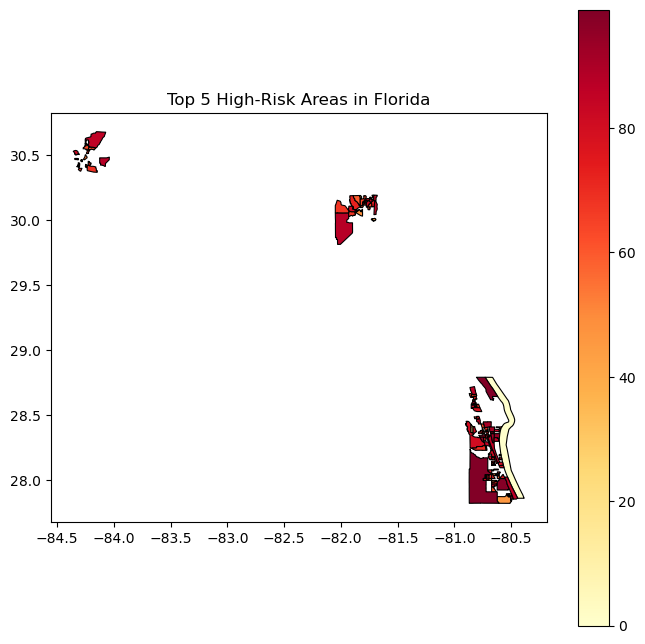

In [14]:
# Plot the GeoDataFrame using geopandas and matplotlib
fig, ax = plt.subplots(figsize=(8, 8))
merged_gdf.plot(
    column='Building Loss Rate Percentile', 
    cmap='YlOrRd', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black',
    legend=True
)

# Add a title to the plot
ax.set_title('Top 5 High-Risk Areas in Florida', fontsize=12)

# Show the plot
plt.show()

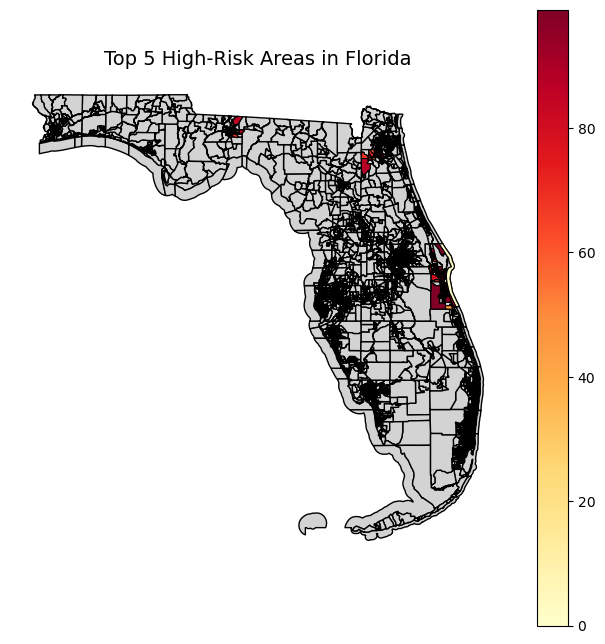

In [15]:
# Plot the Florida map
fig, ax = plt.subplots(figsize=(8, 8))
shapefile_gdf.plot(ax=ax, color='lightgrey', edgecolor='black')

# Overlay the GeoDataFrame with the risk data
merged_gdf.plot(
    column='Building Loss Rate Percentile', 
    cmap='YlOrRd', 
    linewidth=0.8, 
    ax=ax, 
    edgecolor='black',
    legend=True
)

# Add a title to the plot
ax.set_title('Top 5 High-Risk Areas in Florida', fontsize=14)

# Remove axis for better visualization
ax.set_axis_off()

# Show the plot
plt.show()

In [16]:
# Create a Folium map
m = folium.Map(location=[27.994402, -81.760254], zoom_start=6)

# Add the boundaries of Florida using the merged_gdf 
# Convert `merged_gdf` to GeoJSON for Folium
merged_geojson = merged_gdf.to_crs(epsg=4326).to_json()  

# Add a choropleth layer to display the Building Loss Rate Percentile
folium.Choropleth(
    geo_data=merged_geojson,
    name='choropleth',
    data=merged_gdf,
    columns=['geoid', 'Building Loss Rate Percentile'],
    key_on='feature.properties.geoid',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Building Loss Rate Percentile'
).add_to(m)

# Add markers for the top 5 high-risk areas
for _, row in merged_gdf.iterrows():
    centroid = row.geometry.centroid
    folium.CircleMarker(
        location=[centroid.y, centroid.x],
        radius=5 + (row['Building Loss Rate Percentile'] / 20),  
        color='red' if row['geoid'] in merged_gdf['geoid'].values else 'orange',
        fill=True,
        fill_opacity=0.7,
        tooltip=(
            f"<strong>Census Tract GEOID:</strong> {row['geoid']}<br>"
            f"<strong>County:</strong> {row['county']}<br>"
            f"<strong>Building Loss Rate:</strong> {row['Building Loss Rate Percentile']}<br>"
            f"<strong>Population Loss Rate:</strong> {row['Population Loss Rate Percentile']}<br>"
            f"<strong>Energy Burden:</strong> {row['Energy Burden Percentile']}"
        )
    ).add_to(m)

# Add a layer control for toggling the choropleth
folium.LayerControl().add_to(m)

# Save and display the map
m.save('florida_high_risk_areas_map.html')
m

In [17]:
# Extract Data for Each Unique County in the Top 5 Risky Areas
unique_counties = top_5_high_risk_areas_display['county'].unique()

In [18]:
# Visualizations for Each County
for county in unique_counties:
    county_data = merged_gdf[merged_gdf['county'] == county]
    
    # Visualization 1: Age Demographics-male
    age_categories_male = ['Population under 18 years (male)', 'Population over 18 years (male)',
                           'Population over 60 years (male)']
    age_values_male = [county_data[category].sum() for category in age_categories_male]
    
    fig_age_male = px.pie(
        names=age_categories_male,
        values=age_values_male,
        title=f'Age Demographics (Male) in County {county}',
        labels={'names': 'Age Group', 'values': 'Population Percentage (%)'}
    )
    fig_age_male.show()
    
    # Visualization 2: Age Demographics-female
    age_categories_female = ['Population under 18 years (female)', 'Population over 18 years (female)', 
                             'Population over 60 years (female)']
    age_values_female = [county_data[category].sum() for category in age_categories_female]
    
    fig_age_female = px.pie(
        names=age_categories_female,
        values=age_values_female,
        title=f'Age Demographics (Female) in County {county}',
        labels={'names': 'Age Group', 'values': 'Population Percentage (%)'}
    )
    fig_age_female.show()

    # Visualization 3: Poverty Levels by Sex
    fig_poverty_levels = px.bar(
        county_data,
        x='geoid',
        y=['Percentage below poverty (male)','Percentage below poverty (female)'],
        labels={'value': 'Poverty Percentage (%)', 'variable': 'Sex'},
        title=f'Poverty Levels by Sex in County {county}',
    )
    fig_poverty_levels.show()
    
    fig = px.choropleth(
    county_data,
    geojson=county_data.geometry.__geo_interface__,
    locations=county_data.index,
    color='Percentage below poverty (male)',
    hover_name='geoid',
    labels={'Percentage below poverty (male)': 'Poverty (%) -Male'},
    title=f'Poverty Levels in County {county}',
    )
    
    fig.update_geos(fitbounds="locations", visible=False)
    fig.show()
    
    fig = px.choropleth(
    county_data,
    geojson=county_data.geometry.__geo_interface__,
    locations=county_data.index,
    color='Percentage below poverty (female)',
    hover_name='geoid',
    labels={'Percentage below poverty (female)': 'Poverty (%) -Female'},
    title=f'Poverty Levels in County {county}',
    )
    
    fig.update_geos(fitbounds="locations", visible=False)
    fig.show()

    # Visualization 4: Housing Costs
    fig_housing_costs = px.bar(
        county_data,
        x='geoid',
        y=['Housing cost (total)','Housing cost for owners','Housing cost for renters'],
        labels={'value': 'Housing Cost ($)', 'variable': 'Housing Type'},
        title=f'Housing Costs in County {county}',
    )
    fig_housing_costs.show()